In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import scipy as sc 
import skimage as ski
import equinox as eqx
import jax 
import jax.numpy as jnp
import helper as hlp
from tqdm import tqdm
from run_eval import * # NN model

%matplotlib inline
%load_ext autoreload
%autoreload 2

# Working image

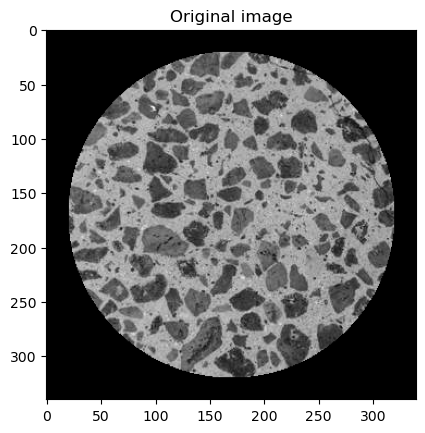

In [2]:
# working img
img = ski.io.imread('data/img/concrete_surface.jpeg').astype(np.float32)
img = ski.color.rgb2gray(img)[:340, :340]

#normalize
img = (img - img.min()) / np.ptp(img) 

# circular clip img 
disk_img = np.zeros(img.shape)
disk_coord = ski.draw.disk((img.shape[0]//2,img.shape[1]//2), 150)
disk_img[disk_coord] = 1
target_img = img*disk_img

plt.imshow(target_img, cmap= 'gray')
plt.title('Original image')
plt.show()


# FBP Performance

- Presentation of dense sampling i.e (1 projection per degree) sinogramms with high and low noise level 

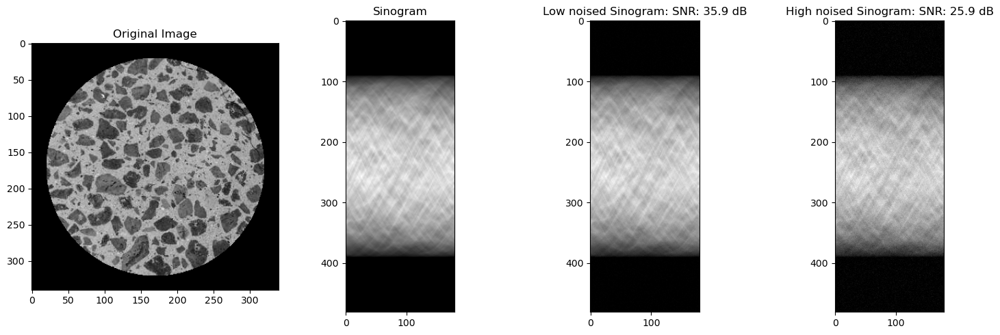

In [3]:
# Sinograms with dense angle sampling
angles =  jnp.arange(0, 180, 1) # in degree 
sino_par = hlp.radon_transform(target_img, angles) 
E_sig = np.sum(sino_par**2)  # energy in the signal

# low noise 
seed = 4
rng = np.random.default_rng(seed)  
low_SNR_dB = 35 # target SNR
low_SNR = 10 ** (low_SNR_dB / 10)
E_low_noise = E_sig / low_SNR
low_gaussian_noise = np.sqrt(E_low_noise / sino_par.size) * rng.standard_normal(sino_par.shape)
low_noise_sino_par = sino_par + low_gaussian_noise
low_noise_sino_par= np.clip(low_noise_sino_par, 0, None)

# high noise 
high_seed = 5
high_rng = np.random.default_rng(high_seed) 
high_SNR_dB = 25 # target SNR
high_SNR = 10 ** (high_SNR_dB / 10)
E_high_noise = E_sig / high_SNR
gaussian_high_noise = np.sqrt(E_high_noise / sino_par.size) * high_rng.standard_normal(sino_par.shape)
high_noise_sino_par = sino_par + gaussian_high_noise
high_noise_sino_par= np.clip(high_noise_sino_par, 0, None)



# plot
low_val_SNR = hlp.SNR(sino_par, low_noise_sino_par, normalize = False)
high_val_SNR = hlp.SNR(sino_par, high_noise_sino_par, normalize = False)


fig, (ax1, ax2, ax3, ax4) = plt.subplots(1,4, figsize =(15,5))
ax1.imshow(target_img, cmap= "gray")
ax1.set_title('Original Image')
ax2.imshow(sino_par, cmap= "gray")
ax2.set_title('Sinogram')
ax3.imshow(low_noise_sino_par, cmap='gray')
ax3.set_title(f'Low noised Sinogram: SNR: {low_val_SNR:.1f} dB')
ax4.set_title(f'High noised Sinogram: SNR: {high_val_SNR:.1f} dB')
ax4.imshow(high_noise_sino_par, cmap='gray')
plt.tight_layout()
plt.show()

- Reconstructions using only FBP with low/high noise sinogramms with different number of projections

Compute all reconstructions

In [4]:
reconst_low_noise_list = []
reconst_high_noise_list = []


# low noise
seed = 4
rng = np.random.default_rng(seed)  
SNR_dB = 35 # target SNR
SNR = 10 ** (SNR_dB / 10)

# high noise
high_seed = 5
high_rng = np.random.default_rng(high_seed) 
high_SNR_dB = 25 # target SNR
high_SNR = 10 ** (high_SNR_dB / 10)

for i in tqdm(range(6)):

    # angles, nbr angles = 180 is the 100%, 10% equal 18
    nbr_angles = 180 - i*18
    angle_space = 180/nbr_angles # in degree
    angles = jnp.arange(0,180, angle_space)  # in degree

    # sinogram
    sino_par = hlp.radon_transform(target_img, angles)     

    # low noise
    E_sig = np.sum(sino_par**2)  # energy in the signal
    E_low_noise = E_sig / SNR
    low_gaussian_noise = np.sqrt(E_low_noise / sino_par.size) * rng.standard_normal(sino_par.shape)
    low_noise_sino_par = sino_par + low_gaussian_noise
    low_noise_sino_par= np.clip(low_noise_sino_par, 0, None)
    val_SNR = hlp.SNR(sino_par, low_noise_sino_par, normalize= False)

    # high noise
    E_high_noise = E_sig / high_SNR
    gaussian_high_noise = np.sqrt(E_high_noise / sino_par.size) * high_rng.standard_normal(sino_par.shape)
    high_noise_sino_par = sino_par + gaussian_high_noise
    high_noise_sino_par= np.clip(high_noise_sino_par, 0, None)
    high_val_SNR = hlp.SNR(sino_par, high_noise_sino_par, normalize=False)

    # reconstruction with low noise 
    fbp_low_noise_sino = hlp.fbp_par(low_noise_sino_par, angles, img.shape[0])
    reconst_low_noise_list.append((nbr_angles, val_SNR, fbp_low_noise_sino, low_noise_sino_par))

    # reconstruction with high noise 
    fbp_high_noise_sino = hlp.fbp_par(high_noise_sino_par, angles, img.shape[0])
    reconst_high_noise_list.append((nbr_angles, high_val_SNR, fbp_high_noise_sino, high_noise_sino_par))


# store results for quantitative analysis
high_noise_fbp =reconst_high_noise_list[2]
low_noise_fbp = reconst_low_noise_list[4]


100%|██████████| 6/6 [00:30<00:00,  5.13s/it]


Plot reconstructions low noise case:

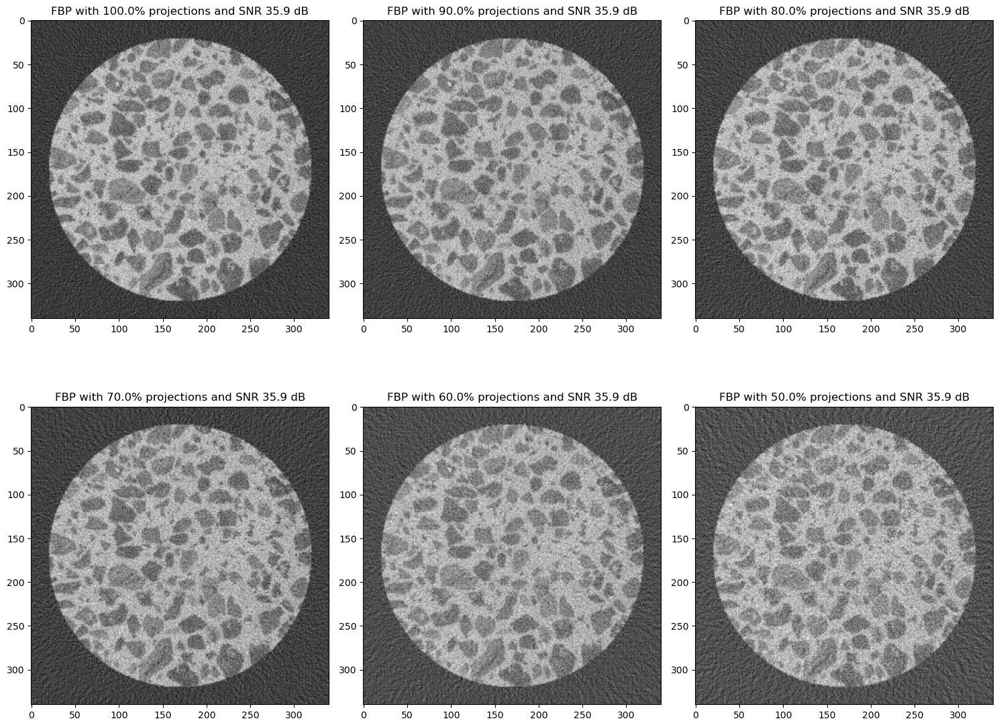

In [5]:
# plot with low noise 
fig, axs = plt.subplots(2,3, figsize =(15,12))
axs = axs.ravel()
for ax, nbr_angles_SNR_reconst  in zip(axs, reconst_low_noise_list):

    nbr_angles, val_SNR, reconst, _ = nbr_angles_SNR_reconst
    ax.set_title(f'FBP with {(nbr_angles/180 * 100):.1f}% projections and SNR {val_SNR:.1f} dB')

    ax.imshow(reconst, cmap= "gray") 

plt.tight_layout()
plt.show()

Compute SNR and CNR for the case with 60% projection and low noise level:

In [6]:
hlp.quant_res(target_img, low_noise_fbp[2])

CNR values: [np.float32(2.5897946), np.float32(2.9975955), np.float32(1.8256487)], mean: 2.471012830734253
SNR : 11.821359634399414 dB


Plot reconstructions high noise case:

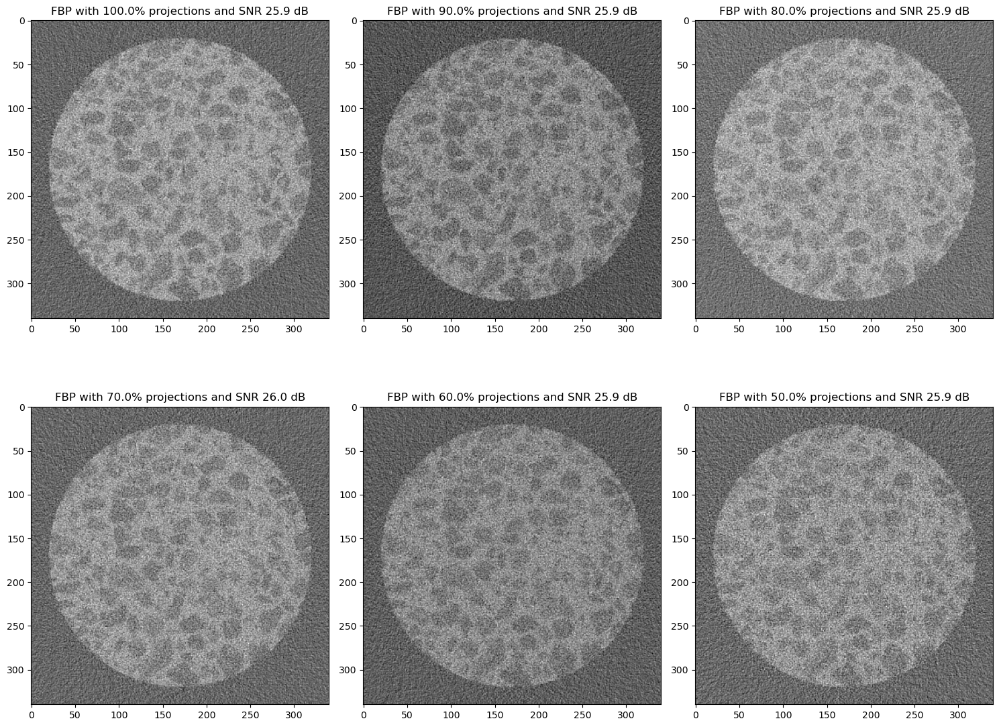

In [7]:
# plot with high noise 
fig, axs = plt.subplots(2,3, figsize =(15,12))
axs = axs.ravel()
for ax, nbr_angles_SNR_reconst  in zip(axs, reconst_high_noise_list):

    nbr_angles, val_SNR, reconst, _ = nbr_angles_SNR_reconst
    ax.set_title(f'FBP with {(nbr_angles/180 * 100):.1f}% projections and SNR {val_SNR:.1f} dB')

    ax.imshow(reconst, cmap= "gray") 

plt.tight_layout()
plt.show()

Compute SNR and CNR for the case with 80% projection and high noise level:

In [8]:
hlp.quant_res(target_img, high_noise_fbp[2])

CNR values: [np.float32(0.7697167), np.float32(1.0672511), np.float32(1.007976)], mean: 0.9483146071434021
SNR : 5.3885908126831055 dB


# Pre-process : Denoise sinogram

The idea of this method is to denoise the sinograms with signal processing/machine learning approaches and then apply FBP to obtain the reconstructions.  

In [9]:
# Input Data
low_nbr_angles, low_val_SNR, fbp_low_noised, low_noised_sino = low_noise_fbp
low_angles = jnp.arange(0,180, 180/low_nbr_angles)  

high_nbr_angles, high_val_SNR, fbp_high_noised, high_noised_sino= high_noise_fbp
high_angles = jnp.arange(0,180, 180/high_nbr_angles)  

- Signal processing approach:

Using ramp-cosine filter for denoising the sinograms and then apply FBP algorithm 

In [10]:
# FBP using ramp-cosine filter 
cos_fbp_low_noised = hlp.fbp_par(low_noised_sino, low_angles, img.shape[0], filter_name="cosine")
cos_fbp_high_noised = hlp.fbp_par(high_noised_sino, high_angles, img.shape[0], filter_name="cosine")


- Machine learning approach:

Denoising the sinogram with a neural network called "MAXIM" (https://github.com/google-research/maxim)

In [11]:
# init model 
ckpt_path = 'maxim/data/ckpt_Denoising_SIDD.npz'
task = 'Denoising'
params = get_params(ckpt_path) 
model = config_model(task)

In [12]:
# apply model

# the model need as input a normalized img !
norm_low_noised_sino = hlp.normalize_img(low_noised_sino)
norm_high_noised_sino = hlp.normalize_img(high_noised_sino)

low_denoised_sino = apply_model(model, params, norm_low_noised_sino)[:,:,0] 
high_denoised_sino = apply_model(model, params, norm_high_noised_sino)[:,:,0] 

# Apply FBP 
maxim_fbp_low = hlp.fbp_par(low_denoised_sino, low_angles, img.shape[0])
maxim_fbp_high = hlp.fbp_par(high_denoised_sino, high_angles, img.shape[0])

- Results

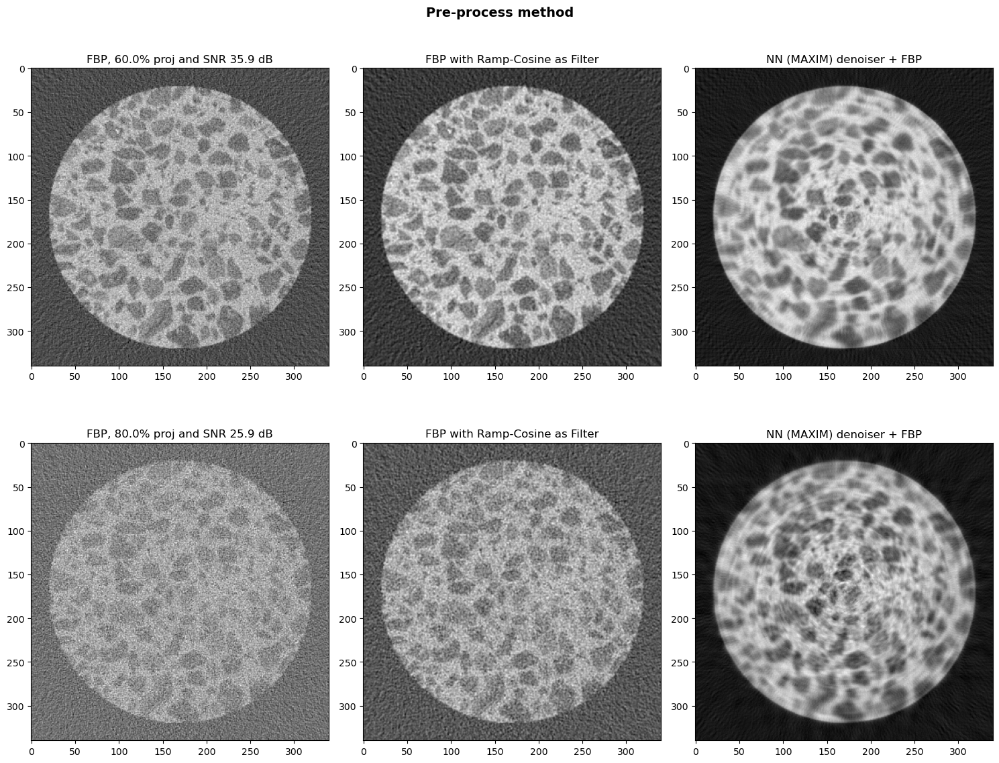

In [13]:
low_recon_list = [low_nbr_angles, low_val_SNR, fbp_low_noised, cos_fbp_low_noised, maxim_fbp_low]
high_recon_list = [high_nbr_angles, high_val_SNR, fbp_high_noised, cos_fbp_high_noised, maxim_fbp_high]

# plot
fig, axs = plt.subplots(2,3, figsize =(15,12))
axs = axs.ravel()
fig.suptitle('Pre-process method', fontsize=14, fontweight='bold')
for i  in [0,1]:

    if i == 0:
        visu_list = low_recon_list
    else:
        visu_list = high_recon_list 
    axs[i*3].set_title(f'FBP, {(visu_list[0]/180 * 100):.1f}% proj and SNR {visu_list[1]:.1f} dB')
    axs[i*3].imshow(visu_list[2], cmap= "gray")
    axs[i*3 + 1].set_title(f'FBP with Ramp-Cosine as Filter')
    axs[i*3 + 1].imshow(visu_list[3], cmap= "gray")
    axs[i*3 + 2].set_title(f'NN (MAXIM) denoiser + FBP')
    axs[i*3 + 2].imshow(visu_list[4], cmap= "gray")


plt.tight_layout()
plt.show()

In [14]:
hlp.summary_quant_res(target_img, low_noise_fbp[2], cos_fbp_low_noised, maxim_fbp_low, 'Low' )
hlp.summary_quant_res(target_img, high_noise_fbp[2], cos_fbp_high_noised, maxim_fbp_high, 'High' )

Low noise level:
Only FBP
CNR values: [np.float32(2.5897946), np.float32(2.9975955), np.float32(1.8256487)], mean: 2.471012830734253
SNR : 11.821359634399414 dB
--------------------
SP approach
CNR values: [np.float32(5.118173), np.float32(5.3592343), np.float32(3.5695434)], mean: 4.68231725692749
SNR : 14.579841613769531 dB
--------------------
ML approach
CNR values: [np.float32(8.576145), np.float32(13.154062), np.float32(7.0431867)], mean: 9.591131210327148
SNR : 11.357484817504883 dB
------------------------------------------------------------
High noise level:
Only FBP
CNR values: [np.float32(0.7697167), np.float32(1.0672511), np.float32(1.007976)], mean: 0.9483146071434021
SNR : 5.3885908126831055 dB
--------------------
SP approach
CNR values: [np.float32(1.6129303), np.float32(1.988511), np.float32(1.7622336)], mean: 1.7878917455673218
SNR : 9.297754287719727 dB
--------------------
ML approach
CNR values: [np.float32(5.331588), np.float32(7.3038573), np.float32(4.3292336)], m

# Post-process : Denoise FBP output

The idea of this method is to denoise the reconstructions provided by FBP algorithm with signal processing/machine learning approaches.

In [15]:
# Input Data
low_nbr_angles, low_val_SNR, fbp_low_noised, low_noised_sino = low_noise_fbp
low_angles = jnp.arange(0,180, 180/low_nbr_angles)  

high_nbr_angles, high_val_SNR, fbp_high_noised, high_noised_sino= high_noise_fbp
high_angles = jnp.arange(0,180, 180/high_nbr_angles)  

- Simple SP method : Median filter  

In [16]:
# use median filter with square 3x3 window
med_fbp_low_noised = sc.ndimage.median_filter(fbp_low_noised, size = (3,3))
med_fbp_high_noised = sc.ndimage.median_filter(fbp_high_noised, size = (3,3))



- ML-Based method : NN MAXIM

In [17]:
# Init model 
ckpt_path = 'maxim/data/ckpt_Denoising_SIDD.npz'
task = 'Denoising'
params = get_params(ckpt_path) 
model = config_model(task)

In [18]:
# denoise FBP reconstructions 
# the model need as input a normalized img !
norm_fbp_low_noised = hlp.normalize_img(fbp_low_noised)
norm_fbp_high_noised = hlp.normalize_img(fbp_high_noised)

maxim_fbp_low_noised = apply_model(model, params, norm_fbp_low_noised)[:,:,0] 
maxim_fbp_high_noised = apply_model(model, params, norm_fbp_high_noised)[:,:,0] 




- Results

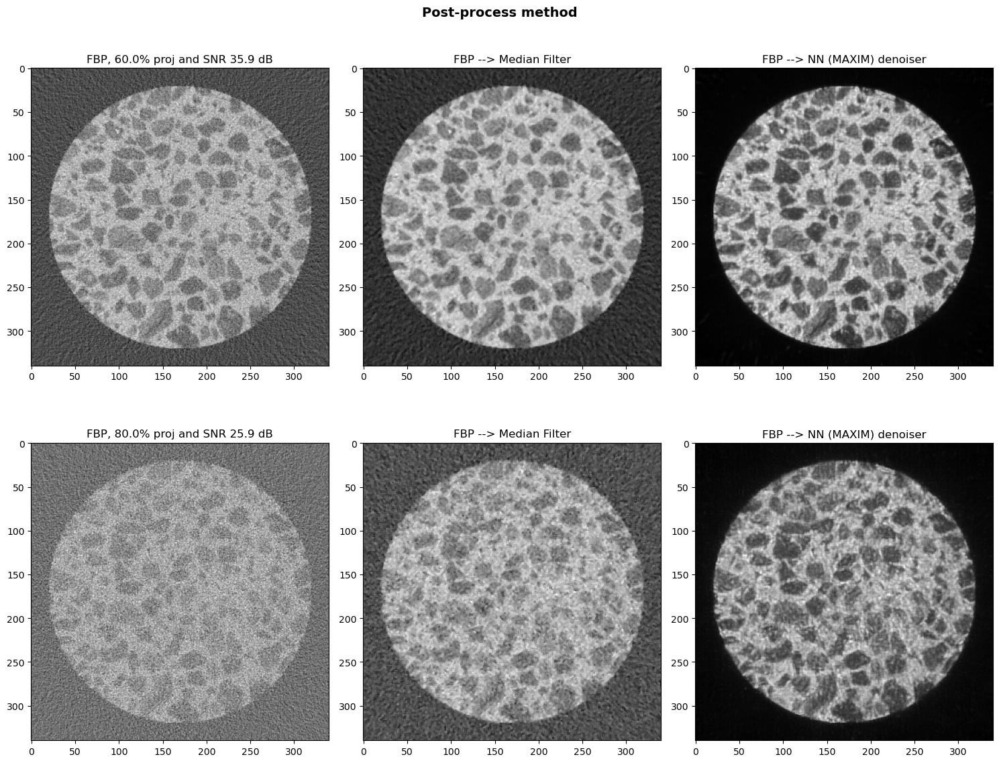

In [19]:
low_recon_list = [low_nbr_angles, low_val_SNR, fbp_low_noised, med_fbp_low_noised, maxim_fbp_low_noised]
high_recon_list = [high_nbr_angles, high_val_SNR, fbp_high_noised, med_fbp_high_noised, maxim_fbp_high_noised]

# plot
fig, axs = plt.subplots(2,3, figsize =(15,12))
axs = axs.ravel()
fig.suptitle('Post-process method', fontsize=14, fontweight='bold')
for i  in [0,1]:
    if i == 0:
        visu_list = low_recon_list
    else:
        visu_list = high_recon_list 
    axs[i*3].set_title(f'FBP, {(visu_list[0]/180 * 100):.1f}% proj and SNR {visu_list[1]:.1f} dB')
    axs[i*3].imshow(visu_list[2], cmap= "gray")
    axs[i*3 + 1].set_title(f'FBP --> Median Filter')
    axs[i*3 + 1].imshow(visu_list[3], cmap= "gray")
    axs[i*3 + 2].set_title(f'FBP --> NN (MAXIM) denoiser')
    axs[i*3 + 2].imshow(visu_list[4], cmap= "gray")


plt.tight_layout()
plt.show()

In [20]:
hlp.summary_quant_res(target_img, low_noise_fbp[2], med_fbp_low_noised, maxim_fbp_low_noised, 'Low' )
hlp.summary_quant_res(target_img, high_noise_fbp[2], med_fbp_high_noised, maxim_fbp_high_noised, 'High' )

Low noise level:
Only FBP
CNR values: [np.float32(2.5897946), np.float32(2.9975955), np.float32(1.8256487)], mean: 2.471012830734253
SNR : 11.821359634399414 dB
--------------------
SP approach
CNR values: [np.float32(7.022996), np.float32(7.8758774), np.float32(4.3928547)], mean: 6.430576324462891
SNR : 15.097880363464355 dB
--------------------
ML approach
CNR values: [np.float32(8.480621), np.float32(6.7848916), np.float32(4.713526)], mean: 6.659679412841797
SNR : 14.13224983215332 dB
------------------------------------------------------------
High noise level:
Only FBP
CNR values: [np.float32(0.7697167), np.float32(1.0672511), np.float32(1.007976)], mean: 0.9483146071434021
SNR : 5.3885908126831055 dB
--------------------
SP approach
CNR values: [np.float32(2.0110922), np.float32(2.391145), np.float32(2.4312499)], mean: 2.2778289318084717
SNR : 11.183146476745605 dB
--------------------
ML approach
CNR values: [np.float32(3.220308), np.float32(5.3906026), np.float32(2.8074472)], m

# Model-based reconstruction: starting from FBP

The idea here is to solve an optimization problem of the form:
$$
\hat{\mathbf{x}}_{\mathrm{opt}} = \arg\min_{\mathbf{x}} \left\| R(\mathbf{x}) - \mathbf{y} \right\|_2^2  + \lambda f(\mathbf{x})
$$
where R is the forward operator (i.e. X-ray transform), $\mathbf{x}$ the image to reconstruct, $\mathbf{y}$ the target sinogram, $f(\mathbf{x})$ a regularization term and $\lambda$ its corresponding weight, by using iterative methods with the FBP reconstruction as initial guess.

In the following cells, several optimizations are presented by varying the choice of the regularization term $f(\mathbf{x})$.

### Least Square

The optimization problem is the following:
$$
\hat{\mathbf{x}}_{\mathrm{opt}}  = \arg\min_{\mathbf{x}} \|R(\mathbf{x}) - \mathbf{y}\|_2^2 
$$

which is solve by using Gradient Descent algorithm.

- Low Noise

In [21]:
# init --> low noise sinogram and corresponded fbp reconstruction
nbr_angles, val_SNR, fbp, sino = low_noise_fbp
alpha = 1e-5#
n_iter = 360

GD_optimizer = hlp.Optimizer(x_init=fbp, y = sino, nbr_angles= nbr_angles, solver= hlp.GD_step, alpha=alpha, n_iter= n_iter)

    

In [22]:
# solve optimization
losses, LS_rcst_low = GD_optimizer.solve()

100%|██████████| 360/360 [04:17<00:00,  1.40it/s]


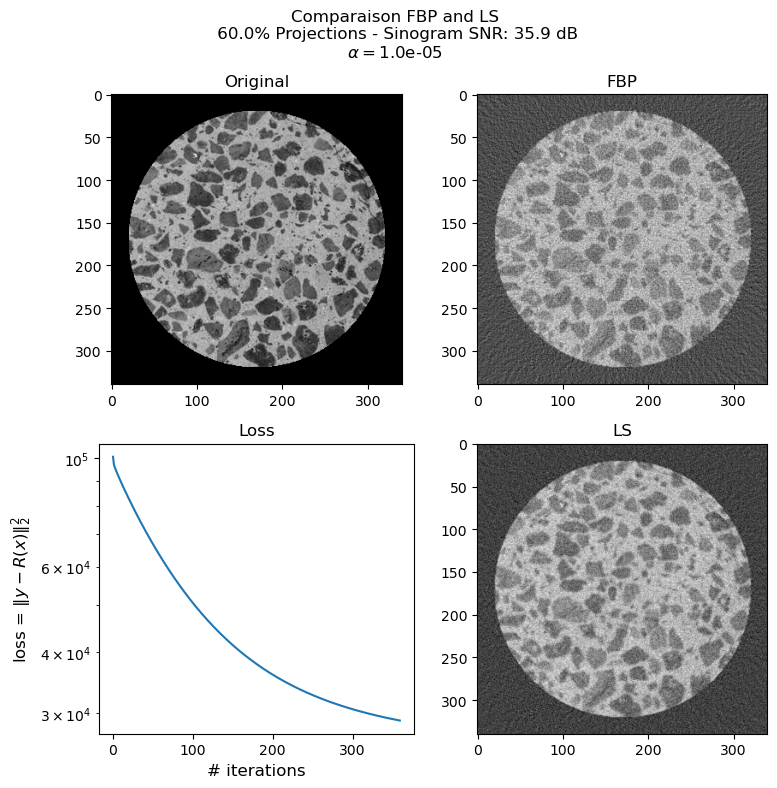

In [ ]:
# plot
fig, axs = plt.subplots(2,2, figsize =(8,8))
ax1, ax2, ax3, ax4 = axs.ravel()
fig.suptitle(f'Comparaison FBP and LS\n {(nbr_angles/180 * 100):.1f}% Projections - Sinogram SNR: {val_SNR:.1f} dB\n' + r'$\alpha =$' + f'{alpha:.1e}')
ax1.set_title('Original')
ax1.imshow(target_img, cmap= "gray") 
ax2.set_title(f'FBP')
ax2.imshow(fbp, cmap= "gray")
ax4.set_title('LS')
ax4.imshow(LS_rcst_low, cmap= "gray")
ax3.semilogy(losses)
ax3.set_title('Loss')
ax3.set_xlabel('# iterations' ,fontsize=12)
ax3.set_ylabel('loss = ' + r"$\| y - R(x) \|_2^2$",  fontsize=12)
plt.tight_layout()
plt.show()

In [24]:
print('Only FBP:')
hlp.quant_res(target_img, low_noise_fbp[2])
print(25*'-')
print('LS')
hlp.quant_res(target_img, LS_rcst_low)


Only FBP:
CNR values: [np.float32(2.5897946), np.float32(2.9975955), np.float32(1.8256487)], mean: 2.471012830734253
SNR : 11.821359634399414 dB
-------------------------
LS
CNR values: [np.float32(3.6828103), np.float32(3.9418738), np.float32(2.5226717)], mean: 3.3824520111083984
SNR : 14.093742370605469 dB


- High noise 

In [25]:
# init --> high noise sinogram and corresponded fbp reconstruction
nbr_angles, val_SNR, fbp, sino = high_noise_fbp
alpha = 1e-5#
n_iter = 360

GD_optimizer = hlp.Optimizer(x_init=fbp, y = sino, nbr_angles= nbr_angles, solver= hlp.GD_step, alpha=alpha, n_iter= n_iter)

    

In [26]:
# solve optimization
losses, LS_rcst_high = GD_optimizer.solve()

100%|██████████| 360/360 [05:56<00:00,  1.01it/s]


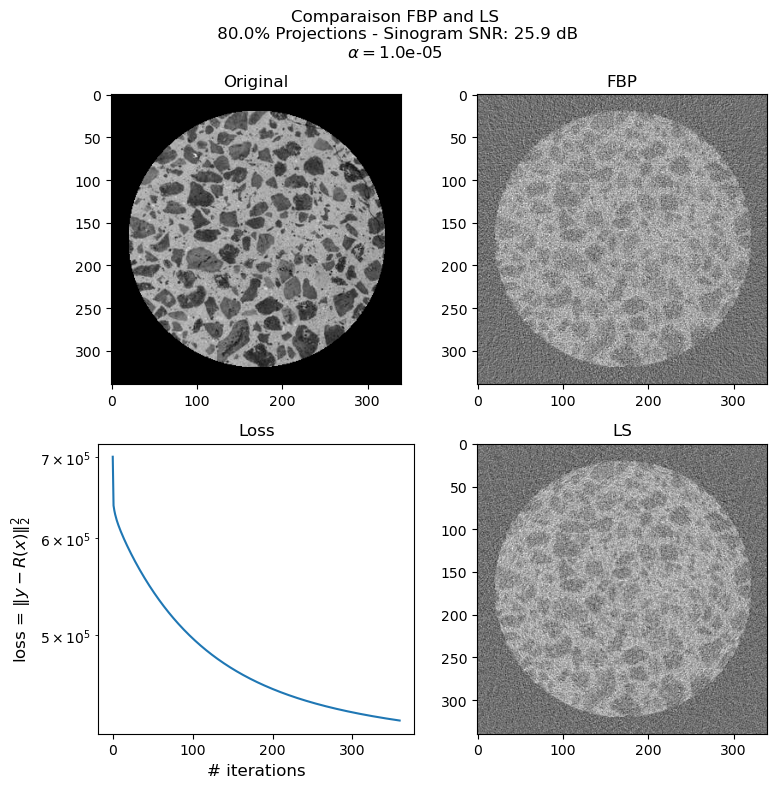

In [27]:
# plot
fig, axs = plt.subplots(2,2, figsize =(8,8))
ax1, ax2, ax3, ax4 = axs.ravel()
fig.suptitle(f'Comparaison FBP and LS\n {(nbr_angles/180 * 100):.1f}% Projections - Sinogram SNR: {val_SNR:.1f} dB\n' + r'$\alpha =$' + f'{alpha:.1e}')
ax1.set_title('Original')
ax1.imshow(target_img, cmap= "gray") 
ax2.set_title(f'FBP')
ax2.imshow(fbp, cmap= "gray")
ax4.set_title('LS')
ax4.imshow(LS_rcst_high, cmap= "gray")
ax3.semilogy(losses)
ax3.set_title('Loss')
ax3.set_xlabel('# iterations' ,fontsize=12)
ax3.set_ylabel('loss = ' + r"$\| y - R(x) \|_2^2$",  fontsize=12)
plt.tight_layout()
plt.show()

In [28]:
print('Only FBP:')
hlp.quant_res(target_img, high_noise_fbp[2])
print(25*'-')
print('LS:')
hlp.quant_res(target_img, LS_rcst_high)

Only FBP:
CNR values: [np.float32(0.7697167), np.float32(1.0672511), np.float32(1.007976)], mean: 0.9483146071434021
SNR : 5.3885908126831055 dB
-------------------------
LS:
CNR values: [np.float32(0.9690364), np.float32(1.1250098), np.float32(1.1563004)], mean: 1.083448886871338
SNR : 5.882381439208984 dB


### Least Square + Support and Postivity $\mathbb{R}^{+}$ constraints 

The optimization problem is the following:
$$
\hat{\mathbf{x}}_{\mathrm{opt}}  = \arg\min_{\mathbf{x}\in \mathcal{C}} \|R(\mathbf{x}) - \mathbf{y}\|_2^2 
$$

with $\mathcal{C}$ the support and positivity constraints, which is solve by using Proximal Gradient Descent algorithm. 

- Low noise

In [29]:
# init --> low noise sinogram and corresponding fbp reconstruction
nbr_angles, val_SNR, fbp, sino = low_noise_fbp
alpha = 1e-5#
n_iter = 360

PGD_optimizer = hlp.Optimizer(x_init=fbp, y = sino, nbr_angles= nbr_angles, solver= hlp.PGD_pos_supp_step, alpha=alpha, n_iter= n_iter)


In [30]:
# solve optimization
losses, LS_pos_supp_low = PGD_optimizer.solve()

100%|██████████| 360/360 [04:47<00:00,  1.25it/s]


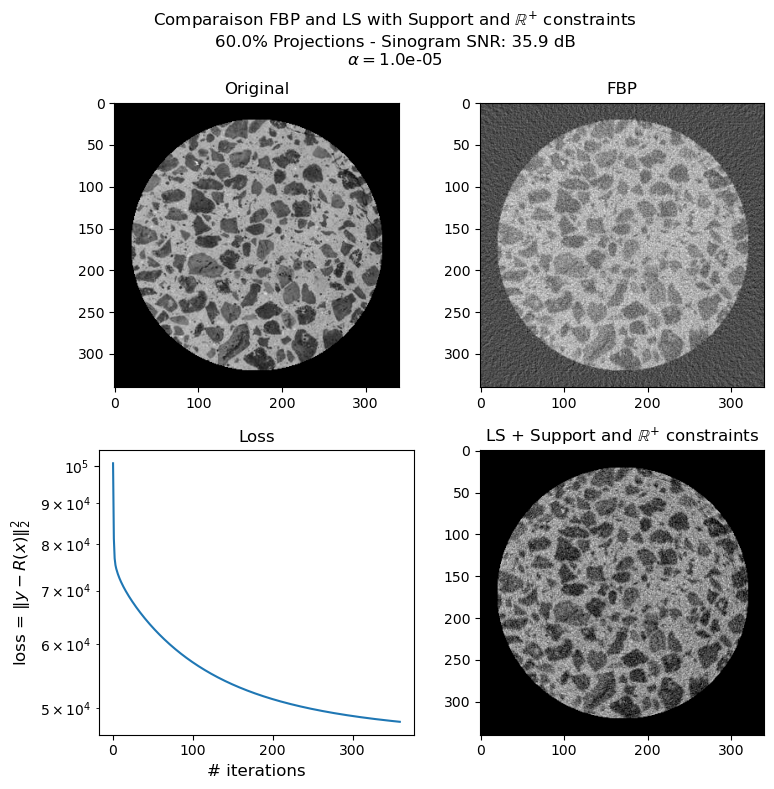

In [31]:
# plot
fig, axs = plt.subplots(2,2, figsize =(8,8))
ax1, ax2, ax3, ax4 = axs.ravel()
fig.suptitle(f'Comparaison FBP and LS with Support and ' +r'$\mathbb{R}^{+}$' +' constraints\n' f'{(nbr_angles/180 * 100):.1f}% Projections - Sinogram SNR: {val_SNR:.1f} dB\n' + r'$\alpha =$' + f'{alpha:.1e}')
ax1.set_title('Original')
ax1.imshow(target_img, cmap= "gray") 
ax2.set_title(f'FBP')
ax2.imshow(fbp, cmap= "gray")
ax4.set_title('LS + Support and ' +r'$\mathbb{R}^{+}$' +' constraints')
ax4.imshow(LS_pos_supp_low, cmap= "gray")
ax3.semilogy(losses)
ax3.set_title('Loss')
ax3.set_xlabel('# iterations' ,fontsize=12)
ax3.set_ylabel('loss = ' + r"$\| y - R(x) \|_2^2$",  fontsize=12)
plt.tight_layout()
plt.show()

In [32]:
print('Only FBP:')
hlp.quant_res(target_img, low_noise_fbp[2])
print(25*'-')
print('LS + Support and Positivity constraints:')
hlp.quant_res(target_img, LS_pos_supp_low)

Only FBP:
CNR values: [np.float32(2.5897946), np.float32(2.9975955), np.float32(1.8256487)], mean: 2.471012830734253
SNR : 11.821359634399414 dB
-------------------------
LS + Support and Positivity constraints:
CNR values: [np.float32(3.1135283), np.float32(3.3894224), np.float32(2.103743)], mean: 2.8688976764678955
SNR : 13.57032299041748 dB


- High noise

In [33]:
# init --> high noise sinogram and corresponding fbp reconstruction
nbr_angles, val_SNR, fbp, sino = high_noise_fbp
alpha = 1e-6#
n_iter = 30

PGD_optimizer = hlp.Optimizer(x_init=fbp, y = sino, nbr_angles= nbr_angles, solver= hlp.PGD_pos_supp_step, alpha=alpha, n_iter= n_iter)


In [34]:
# solve optimization
losses, LS_pos_supp_high = PGD_optimizer.solve()

100%|██████████| 30/30 [00:00<00:00, 1303.71it/s]


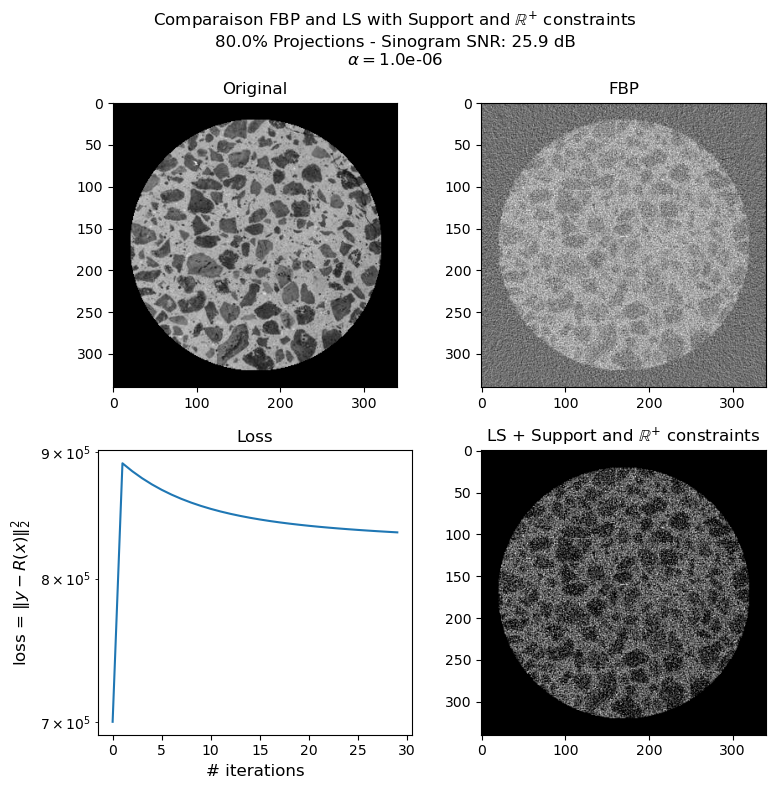

In [35]:
# plot
fig, axs = plt.subplots(2,2, figsize =(8,8))
ax1, ax2, ax3, ax4 = axs.ravel()
fig.suptitle(f'Comparaison FBP and LS with Support and ' +r'$\mathbb{R}^{+}$' +' constraints\n' f'{(nbr_angles/180 * 100):.1f}% Projections - Sinogram SNR: {val_SNR:.1f} dB\n' + r'$\alpha =$' + f'{alpha:.1e}')
ax1.set_title('Original')
ax1.imshow(target_img, cmap= "gray") 
ax2.set_title(f'FBP')
ax2.imshow(fbp, cmap= "gray")
ax4.set_title('LS + Support and ' +r'$\mathbb{R}^{+}$' +' constraints')
ax4.imshow(LS_pos_supp_high, cmap= "gray")
ax3.semilogy(losses)
ax3.set_title('Loss')
ax3.set_xlabel('# iterations' ,fontsize=12)
ax3.set_ylabel('loss = ' + r"$\| y - R(x) \|_2^2$",  fontsize=12)
plt.tight_layout()
plt.show()

In [36]:
print('Only FBP:')
hlp.quant_res(target_img, high_noise_fbp[2])
print(25*'-')
print('LS + Support and Positivity constraints:')
hlp.quant_res(target_img, LS_pos_supp_high)

Only FBP:
CNR values: [np.float32(0.7697167), np.float32(1.0672511), np.float32(1.007976)], mean: 0.9483146071434021
SNR : 5.3885908126831055 dB
-------------------------
LS + Support and Positivity constraints:
CNR values: [np.float32(0.7698651), np.float32(1.0661178), np.float32(1.0115669)], mean: 0.9491832256317139
SNR : 5.797063827514648 dB


### Least Square + Support and Postivity $\mathbb{R}^{+}$ constraints + Tikhonov regularization

The optimization problem is the following:
$$
\hat{\mathbf{x}}_{\mathrm{opt}}  = \arg\min_{\mathbf{x}\in \mathcal{C}} \|R(\mathbf{x}) - \mathbf{y}\|_2^2 + \lambda \|\mathbf{x}\|_2^2
$$

with $\mathcal{C}$ the support and positivity constraints and $\lambda\|\mathbf{x}\|_2^2$ the Tikhonov regularizer. This optimization problem is solve by using Proximal Gradient Descent algorithm. 

- Low noise 

In [57]:
# init --> low noise sinogram and corresponding fbp reconstruction
nbr_angles, val_SNR, fbp, sino = low_noise_fbp
alpha = 1e-5#
n_iter = 360
lam = 1e-1 

PGD_rL2_optimizer = hlp.Optimizer(x_init=fbp, y = sino, nbr_angles= nbr_angles, solver= hlp.PGD_pos_supp_rL2_step, alpha=alpha, lam = lam, n_iter= n_iter)


In [58]:
# solve optimization
losses, rcst_tikh_low = PGD_rL2_optimizer.solve()

100%|██████████| 360/360 [04:05<00:00,  1.47it/s]


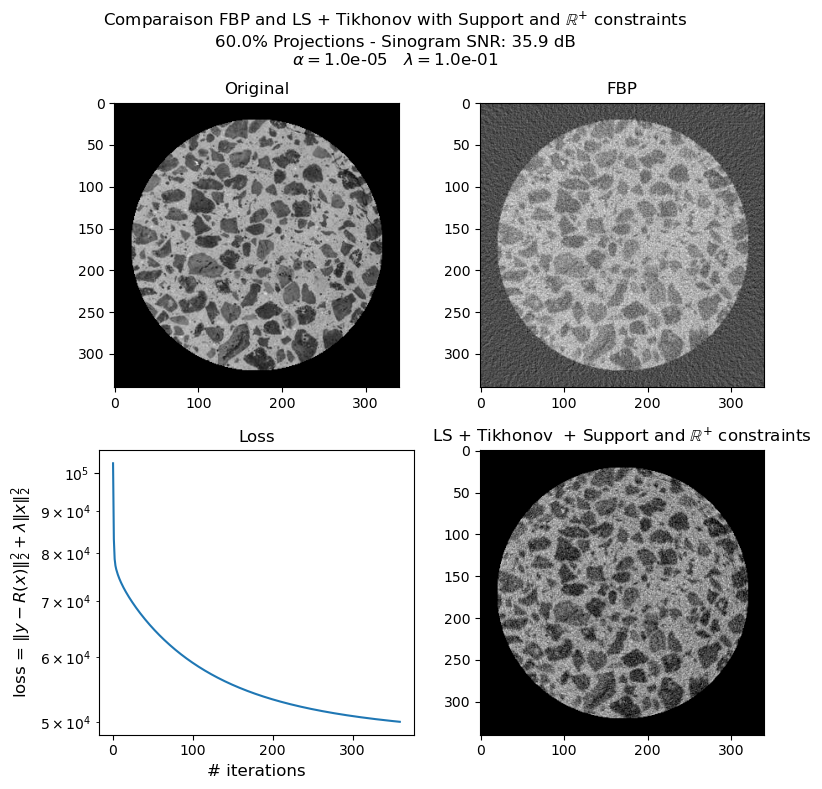

In [59]:
# plot
fig, axs = plt.subplots(2,2, figsize =(8,8))
ax1, ax2, ax3, ax4 = axs.ravel()
fig.suptitle(f'Comparaison FBP and LS + Tikhonov with Support and ' +r'$\mathbb{R}^{+}$' +' constraints\n' f'{(nbr_angles/180 * 100):.1f}% Projections - Sinogram SNR: {val_SNR:.1f} dB\n' + r'$\alpha =$' + f'{alpha:.1e}'+ r'   $\lambda =$' + f'{lam:.1e}')
ax1.set_title('Original')
ax1.imshow(target_img, cmap= "gray") 
ax2.set_title(f'FBP')
ax2.imshow(fbp, cmap= "gray")
ax4.set_title('LS + Tikhonov  + Support and ' +r'$\mathbb{R}^{+}$' +' constraints')
ax4.imshow(rcst_tikh_low, cmap= "gray")
ax3.semilogy(losses)
ax3.set_title('Loss')
ax3.set_xlabel('# iterations' ,fontsize=12)
ax3.set_ylabel('loss = ' + r"$\| y - R(x) \|_2^2 + \lambda\| x \|_2^2$",  fontsize=12)
plt.tight_layout()
plt.show()

In [40]:
print('Only FBP:')
hlp.quant_res(target_img, low_noise_fbp[2])
print(25*'-')
print('LS + Support and Positivity constraints + Tikhonov')
hlp.quant_res(target_img, rcst_tikh_low)

Only FBP:
CNR values: [np.float32(2.5897946), np.float32(2.9975955), np.float32(1.8256487)], mean: 2.471012830734253
SNR : 11.821359634399414 dB
-------------------------
LS + Support and Positivity constraints + Tikhonov
CNR values: [np.float32(3.114769), np.float32(3.3908343), np.float32(2.1046479)], mean: 2.870083808898926
SNR : 13.575587272644043 dB


- High noise

In [60]:
# init --> high noise sinogram and corresponding fbp reconstruction
nbr_angles, val_SNR, fbp, sino = high_noise_fbp
alpha = 1e-5#
n_iter = 360
lam = 1e-1

PGD_rL2_optimizer = hlp.Optimizer(x_init=fbp, y = sino, nbr_angles= nbr_angles, solver= hlp.PGD_pos_supp_rL2_step, alpha=alpha, lam = lam, n_iter= n_iter)


In [61]:
# solve optimization
losses, rcst_tikh_high = PGD_rL2_optimizer.solve()

100%|██████████| 360/360 [05:36<00:00,  1.07it/s]


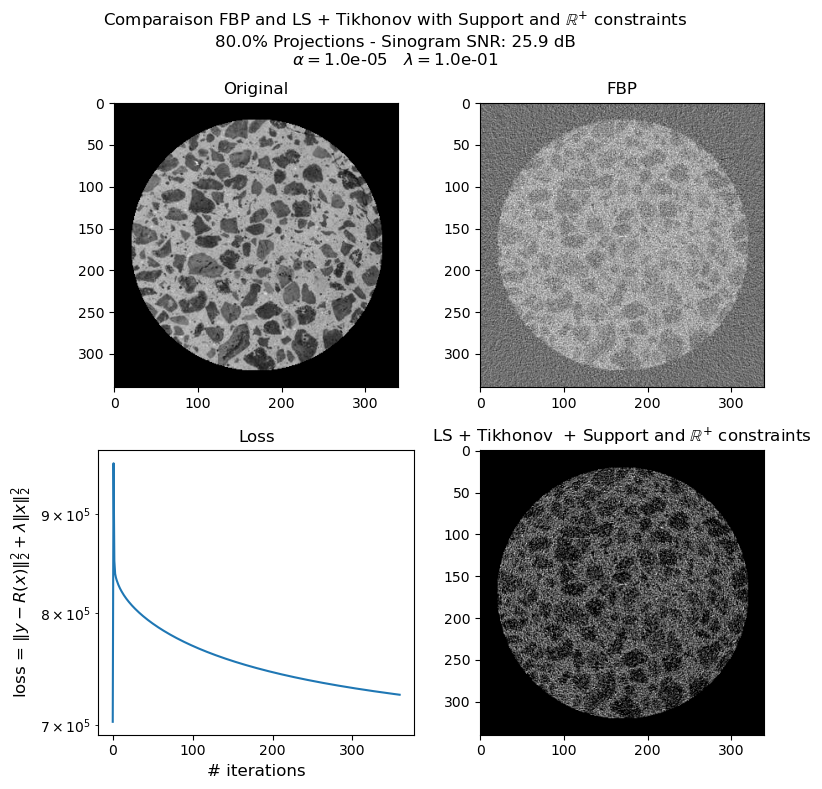

In [62]:
# plot
fig, axs = plt.subplots(2,2, figsize =(8,8))
ax1, ax2, ax3, ax4 = axs.ravel()
fig.suptitle(f'Comparaison FBP and LS + Tikhonov with Support and ' +r'$\mathbb{R}^{+}$' +' constraints\n' f'{(nbr_angles/180 * 100):.1f}% Projections - Sinogram SNR: {val_SNR:.1f} dB\n' + r'$\alpha =$' + f'{alpha:.1e}'+ r'   $\lambda =$' + f'{lam:.1e}')
ax1.set_title('Original')
ax1.imshow(target_img, cmap= "gray") 
ax2.set_title(f'FBP')
ax2.imshow(fbp, cmap= "gray")
ax4.set_title('LS + Tikhonov  + Support and ' +r'$\mathbb{R}^{+}$' +' constraints')
ax4.imshow(rcst_tikh_high, cmap= "gray")
ax3.semilogy(losses)
ax3.set_title('Loss')
ax3.set_xlabel('# iterations' ,fontsize=12)
ax3.set_ylabel('loss = ' + r"$\| y - R(x) \|_2^2 + \lambda\| x \|_2^2$",  fontsize=12)
plt.tight_layout()
plt.show()

In [44]:
print('Only FBP:')
hlp.quant_res(target_img, high_noise_fbp[2])
print(25*'-')
print('LS + Support and Positivity constraints + Tikhonov')
hlp.quant_res(target_img, rcst_tikh_high)

Only FBP:
CNR values: [np.float32(0.7697167), np.float32(1.0672511), np.float32(1.007976)], mean: 0.9483146071434021
SNR : 5.3885908126831055 dB
-------------------------
LS + Support and Positivity constraints + Tikhonov
CNR values: [np.float32(0.83407456), np.float32(0.97362643), np.float32(0.972479)], mean: 0.9267266392707825
SNR : 5.2423787117004395 dB


### Least Square + Support and Postivity $\mathbb{R}^{+}$ constraints + Total Variation (TV) regularization

The optimization problem is the following:
$$
\hat{\mathbf{x}}_{\mathrm{opt}}  = \arg\min_{\mathbf{x}\in \mathcal{C}} \|R(\mathbf{x}) - \mathbf{y}\|_2^2 + \lambda \|\mathbf{\nabla x}\|_1
$$

with $\mathcal{C}$ the support and positivity constraints and $\lambda\|\mathbf{\nabla x}\|_1$ the TV regularizer. This optimization problem is solve by using Proximal Gradient Descent algorithm. 

- Low noise

In [45]:
# init --> low noise sinogram and corresponding fbp reconstruction
nbr_angles, val_SNR, fbp, sino = low_noise_fbp
alpha = 1e-5#
n_iter = 360
lam = 1e-1

PGD_rTV_optimizer = hlp.Optimizer(x_init=fbp, y = sino, nbr_angles= nbr_angles, solver= hlp.PGD_pos_supp_rTV_step, alpha=alpha, lam = lam, n_iter= n_iter)


In [46]:
# solve optimization
losses, recon_TV_low = PGD_rTV_optimizer.solve()

100%|██████████| 360/360 [04:39<00:00,  1.29it/s]


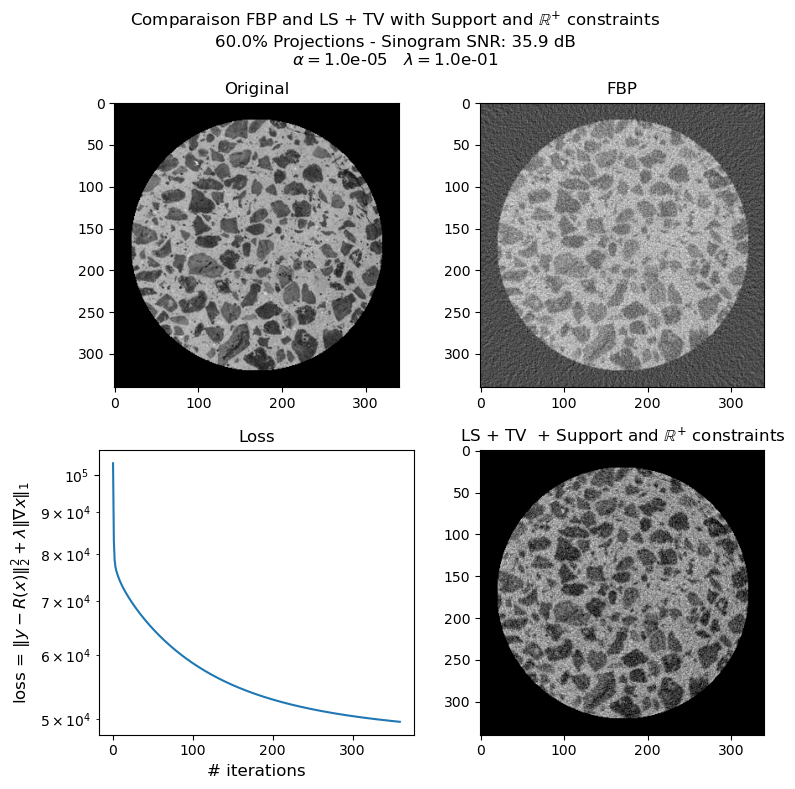

In [47]:
# plot
fig, axs = plt.subplots(2,2, figsize =(8,8))
ax1, ax2, ax3, ax4 = axs.ravel()
fig.suptitle(f'Comparaison FBP and LS + TV with Support and ' +r'$\mathbb{R}^{+}$' +' constraints\n' f'{(nbr_angles/180 * 100):.1f}% Projections - Sinogram SNR: {val_SNR:.1f} dB\n' + r'$\alpha =$' + f'{alpha:.1e}'+ r'   $\lambda =$' + f'{lam:.1e}')
ax1.set_title('Original')
ax1.imshow(target_img, cmap= "gray") 
ax2.set_title(f'FBP')
ax2.imshow(fbp, cmap= "gray")
ax4.set_title('LS + TV  + Support and ' +r'$\mathbb{R}^{+}$' +' constraints')
ax4.imshow(recon_TV_low, cmap= "gray")
ax3.semilogy(losses)
ax3.set_title('Loss')
ax3.set_xlabel('# iterations' ,fontsize=12)
ax3.set_ylabel('loss = ' + r"$\| y - R(x) \|_2^2 + \lambda\|\nabla x \|_1$",  fontsize=12)
plt.tight_layout()
plt.show()

In [48]:
print('Only FBP:')
hlp.quant_res(target_img, low_noise_fbp[2])
print(25*'-')
print('LS + Support and Positivity constraints + TV')
hlp.quant_res(target_img, recon_TV_low)

Only FBP:
CNR values: [np.float32(2.5897946), np.float32(2.9975955), np.float32(1.8256487)], mean: 2.471012830734253
SNR : 11.821359634399414 dB
-------------------------
LS + Support and Positivity constraints + TV
CNR values: [np.float32(3.131438), np.float32(3.4057333), np.float32(2.113496)], mean: 2.8835556507110596
SNR : 13.602127075195312 dB


- High noise

In [49]:
# init --> high noise sinogram and corresponding fbp reconstruction
nbr_angles, val_SNR, fbp, sino = high_noise_fbp
alpha = 1e-5
n_iter = 360
lam = 1e-1 

PGD_rTV_optimizer = hlp.Optimizer(x_init=fbp, y = sino, nbr_angles= nbr_angles, solver= hlp.PGD_pos_supp_rTV_step, alpha=alpha, lam = lam, n_iter= n_iter)


In [50]:
# solve optimization
losses, recon_TV_high = PGD_rTV_optimizer.solve()

100%|██████████| 360/360 [06:00<00:00,  1.00s/it]


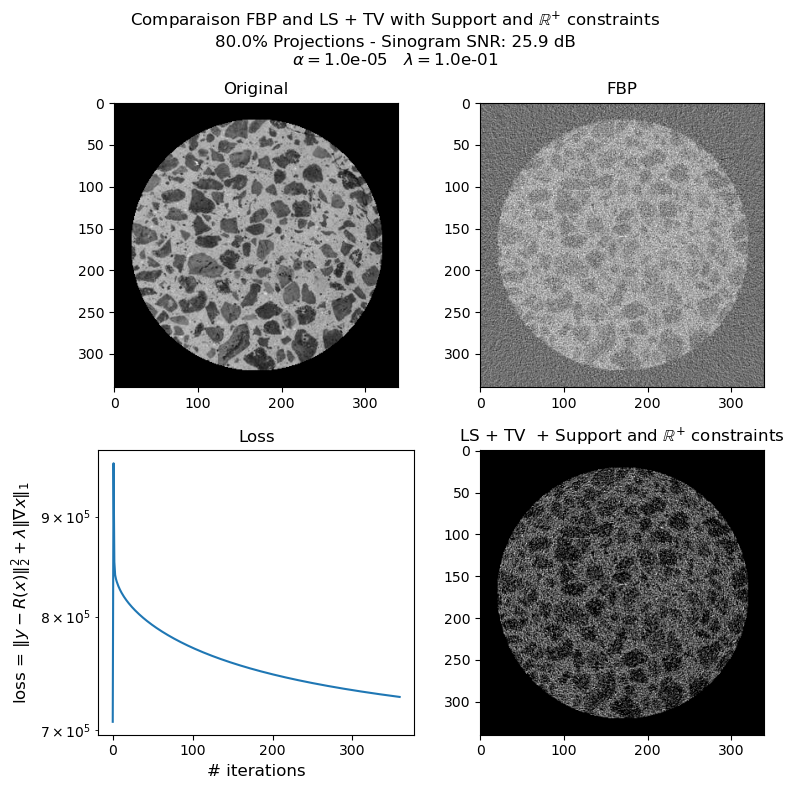

In [51]:
# plot
fig, axs = plt.subplots(2,2, figsize =(8,8))
ax1, ax2, ax3, ax4 = axs.ravel()
fig.suptitle(f'Comparaison FBP and LS + TV with Support and ' +r'$\mathbb{R}^{+}$' +' constraints\n' f'{(nbr_angles/180 * 100):.1f}% Projections - Sinogram SNR: {val_SNR:.1f} dB\n' + r'$\alpha =$' + f'{alpha:.1e}'+ r'   $\lambda =$' + f'{lam:.1e}')
ax1.set_title('Original')
ax1.imshow(target_img, cmap= "gray") 
ax2.set_title(f'FBP')
ax2.imshow(fbp, cmap= "gray")
ax4.set_title('LS + TV  + Support and ' +r'$\mathbb{R}^{+}$' +' constraints')
ax4.imshow(recon_TV_high, cmap= "gray")
ax3.semilogy(losses)
ax3.set_title('Loss')
ax3.set_xlabel('# iterations' ,fontsize=12)
ax3.set_ylabel('loss = ' + r"$\| y - R(x) \|_2^2 + \lambda\|\nabla x \|_1$",  fontsize=12)
plt.tight_layout()
plt.show()

In [52]:
print('Only FBP:')
hlp.quant_res(target_img, high_noise_fbp[2])
print(25*'-')
print('LS + Support and Positivity constraints + TV')
hlp.quant_res(target_img, recon_TV_high)

Only FBP:
CNR values: [np.float32(0.7697167), np.float32(1.0672511), np.float32(1.007976)], mean: 0.9483146071434021
SNR : 5.3885908126831055 dB
-------------------------
LS + Support and Positivity constraints + TV
CNR values: [np.float32(0.8350676), np.float32(0.97467136), np.float32(0.9740506)], mean: 0.9279298186302185
SNR : 5.246379375457764 dB


### Least Square + CNC regularizer: PnP method

Finally, a pretrained regularizer, known as CNC regularizer, is used (https://github.com/axgoujon/weakly_convex_ridge_regularizer/tree/main) as a Plug-and-Play method:


$$
\hat{\mathbf{x}}_{\mathrm{opt}}  = \arg\min_{\mathbf{x}} \|R(\mathbf{x}) - \mathbf{y}\|_2^2 + \lambda Reg_{CNC}(\mathbf{x})
$$


 with $Reg_{CNC}(\mathbf{x})$ the CNC regularizer. 

 For this part, only the results are shown. For implementation details, please refer to the CNC notebook inside ./CNC/models_torch folder.

In [53]:
CNC_low =np.load('data/img/data_35dB_60p.npz')['I_wcvx_denoised']
CNC_high =np.load('data/img/data_25dB_80p.npz')['I_wcvx_denoised']

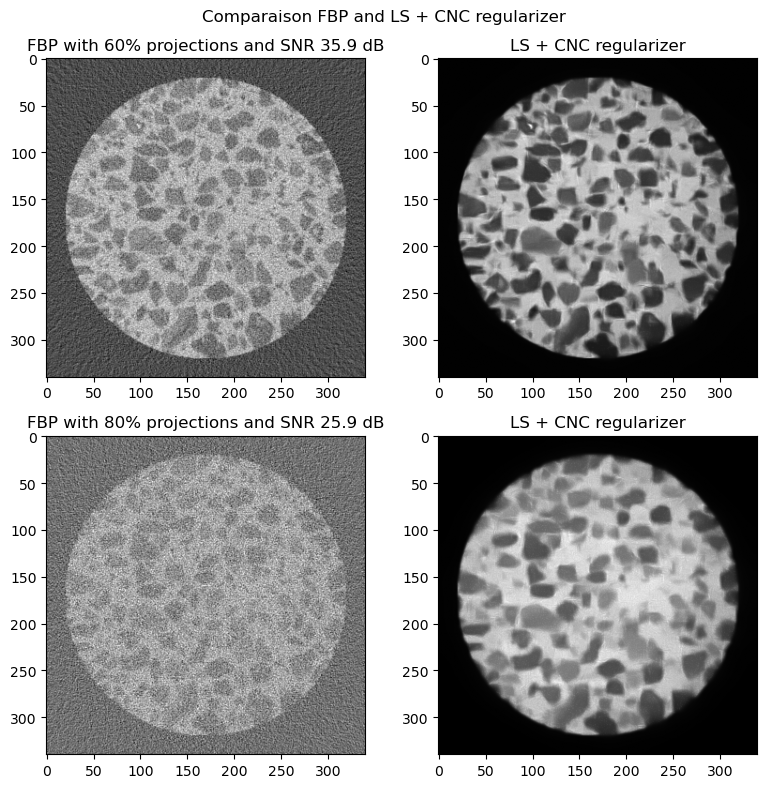

In [54]:
# plot
fig, axs = plt.subplots(2,2, figsize =(8,8))
ax1, ax2, ax3, ax4 = axs.ravel()
fig.suptitle(f'Comparaison FBP and LS + CNC regularizer')
ax1.set_title('FBP with 60% projections and SNR 35.9 dB')
ax1.imshow(low_noise_fbp[2], cmap= "gray") 
ax2.set_title(f'LS + CNC regularizer')
ax2.imshow(CNC_low, cmap= "gray")
ax4.set_title('LS + CNC regularizer')
ax4.imshow(CNC_high, cmap= "gray")
ax3.set_title('FBP with 80% projections and SNR 25.9 dB')
ax3.imshow(high_noise_fbp[2], cmap= "gray")
plt.tight_layout()
plt.show()

In [55]:
print('Low noise:')
print('Only FBP:')
hlp.quant_res(target_img, low_noise_fbp[2])
print(25*'-')
print('LS + CNC regularizer')
hlp.quant_res(target_img, CNC_low)
print(25*'--')
print('High noise:')
print('Only FBP:')
hlp.quant_res(target_img, high_noise_fbp[2])
print(25*'-')
print('LS + CNC regularizer')
hlp.quant_res(target_img, CNC_high)

Low noise:
Only FBP:
CNR values: [np.float32(2.5897946), np.float32(2.9975955), np.float32(1.8256487)], mean: 2.471012830734253
SNR : 11.821359634399414 dB
-------------------------
LS + CNC regularizer
CNR values: [np.float32(14.746664), np.float32(31.548595), np.float32(19.79077)], mean: 22.028676986694336
SNR : 14.53024959564209 dB
--------------------------------------------------
High noise:
Only FBP:
CNR values: [np.float32(0.7697167), np.float32(1.0672511), np.float32(1.007976)], mean: 0.9483146071434021
SNR : 5.3885908126831055 dB
-------------------------
LS + CNC regularizer
CNR values: [np.float32(14.368352), np.float32(33.518726), np.float32(15.336936)], mean: 21.074670791625977
SNR : 10.798725128173828 dB
